In [13]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [2]:
adata = sc.read_h5ad('../data/mtDNA_DSB_5k_clustered_LLM_anno.h5ad')

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [3]:
adata_OL = adata[adata.obs['cell_class'].str.contains('ligo')]

In [6]:
# dimensionality reduction
sc.pp.pca(adata_OL, n_comps=30)
sc.pp.neighbors(adata_OL, n_neighbors=15, n_pcs=30)
sc.tl.umap(adata_OL)

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Skipping 0.3: OL_leiden_0.3 already exists.


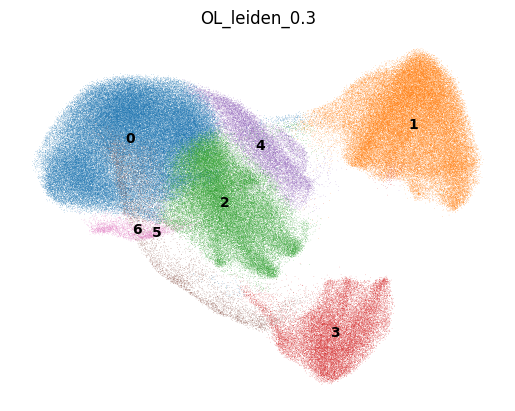

Skipping 0.5: OL_leiden_0.5 already exists.


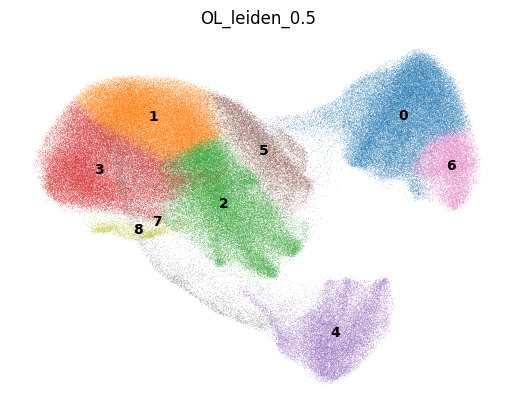

Skipping 0.8: OL_leiden_0.8 already exists.


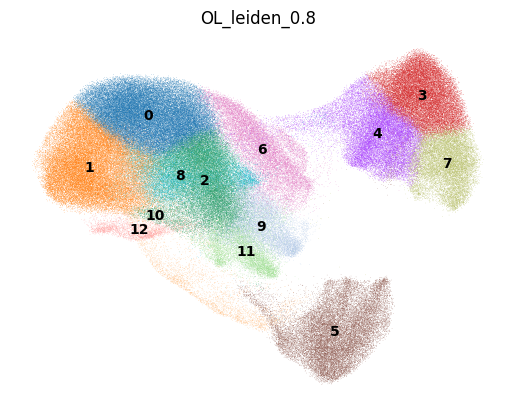

Clustering at resolution 1...


IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out


Done.


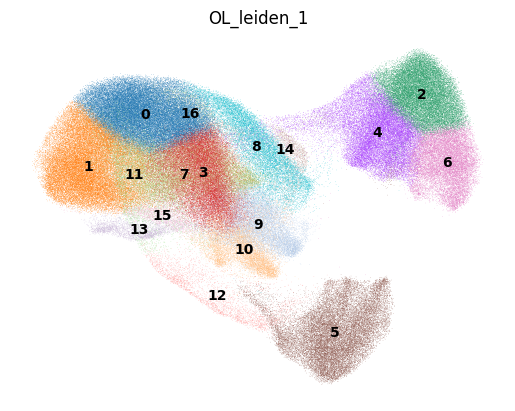

In [51]:
resolutions = [0.3, 0.5,0.8, 1]

for resolution in resolutions:
    key = f'OL_leiden_{resolution}'

    if key in adata_OL.obs.columns:
        print(f"Skipping {resolution}: {key} already exists.")
    else:
        print(f"Clustering at resolution {resolution}...")
        sc.tl.leiden(adata_OL, resolution=resolution, key_added=key)
        print("Done.")

    # plot UMAP
    sc.pl.umap(adata_OL, color=key, legend_loc='on data', frameon=False)

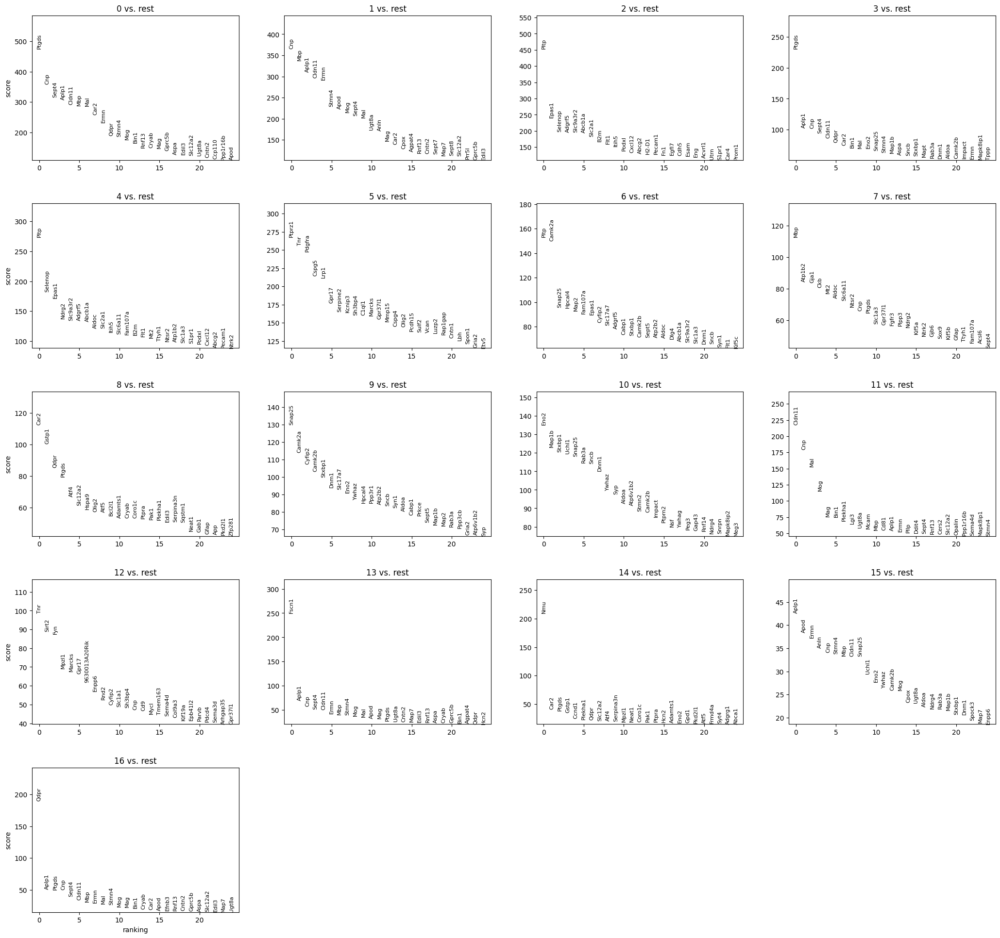

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,Ptgds,475.317108,2.437261,0.0,0.0
1,0,Cnp,358.801453,1.676781,0.0,0.0
2,0,Sept4,315.562958,1.667088,0.0,0.0
3,0,Aplp1,307.231628,1.258438,0.0,0.0
4,0,Cldn11,291.897949,1.660048,0.0,0.0


In [52]:
# --- Find marker genes per cluster ---
sc.tl.rank_genes_groups(adata_OL, groupby="OL_leiden_1", method="t-test")
sc.pl.rank_genes_groups(adata_OL, n_genes=25, sharey=False)

# get a tidy table of top markers
markers = sc.get.rank_genes_groups_df(adata_OL, group=None)
markers.head()

In [53]:
marker_genes = pd.DataFrame({
    group: adata_OL.uns['rank_genes_groups']['names'][group][:20]
    for group in adata_OL.uns['rank_genes_groups']['names'].dtype.names
})


In [54]:
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

0
Ptgds Cnp Sept4 Aplp1 Cldn11 Mbp Mal Car2 Ermn Qdpr Stmn4 Mog Bin1 Rnf13 Cryab Mag Gprc5b Aspa Edil3 Slc12a2
 
1
Cnp Mbp Aplp1 Cldn11 Ermn Stmn4 Apod Mog Sept4 Mal Ugt8a Anln Mag Car2 Cpox Agpat4 Rnf13 Cntn2 Sept7 Map7
 
2
Pltp Epas1 Selenop Adgrf5 Slc9a3r2 Abcb1a Slc2a1 B2m Flt1 Itih5 Podxl Cxcl12 Abcg2 H2-D1 Pecam1 Fn1 Egfl7 Cdh5 Esam Eng
 
3
Ptgds Aplp1 Cnp Sept4 Cldn11 Qdpr Car2 Bin1 Mal Eno2 Snap25 Stmn4 Map1b Aspa Sncb Stxbp1 Mapt Rab3a Dnm1 Aldoa
 
4
Pltp Selenop Epas1 Ndrg2 Slc9a3r2 Adgrf5 Abcb1a Aldoc Slc2a1 Itih5 Slc6a11 Fam107a B2m Flt1 Mt2 Ttyh1 Ntsr2 Atp1b2 Slc1a3 S1pr1
 
5
Ptprz1 Tnr Pdgfra Cspg5 Lrp1 Gpr17 Serpine2 Kcnip3 Sh3bp4 C1ql1 Marcks Gpr37l1 Mmp15 Cspg4 Olig2 Pcdh15 Sulf2 Vcan Luzp2 Rap1gap
 
6
Pltp Camk2a Snap25 Hpcal4 Map2 Fam107a Epas1 Cyfip2 Slc17a7 Adgrf5 Cabp1 Stxbp1 Camk2b Sept5 Atp2b2 Aldoc Dlg4 Abcb1a Slc9a3r2 Slc1a3
 
7
Mbp Atp1b2 Gja1 Ckb Mt2 Aldoc Slc6a11 Ntsr2 Cnp Ptgds Slc1a3 Gpr37l1 Fgfr3 Plpp3 Ndrg2 Kif5a Ntrk2 Gjb6 Sox9 Kif5b
 
8
Car2 Gstp1 Qdp

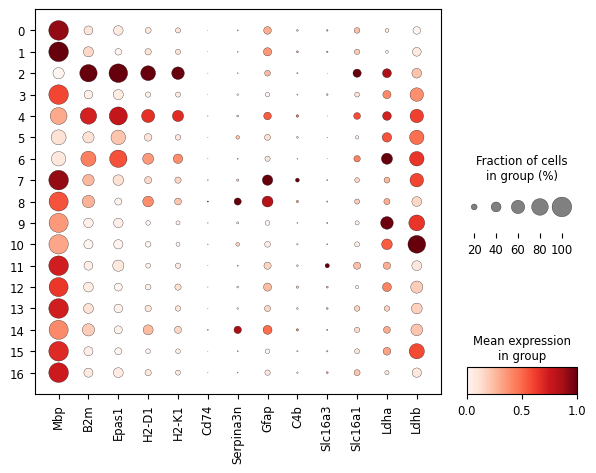

In [62]:
 sc.pl.dotplot(
        adata_OL,
        var_names=['Mbp','B2m', 'Epas1', 'H2-D1', 'H2-K1', 'Cd74','Serpina3n','Gfap','C4b','Slc16a3','Slc16a1','Ldha','Ldhb'],
        groupby="OL_leiden_1",
        standard_scale="var",
        #dot_max=0.5,
        #dot_min=0.05,
        color_map="Reds",
        dendrogram=False,
        figsize=(7, 5),
        
    )

<Figure size 800x500 with 0 Axes>

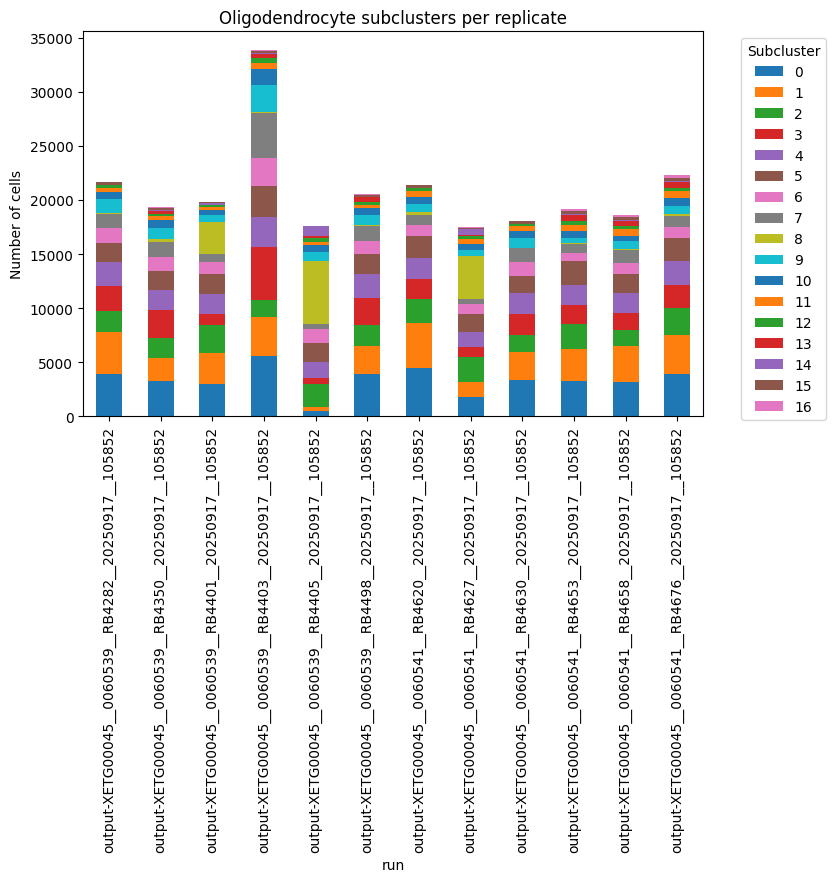

<Figure size 800x500 with 0 Axes>

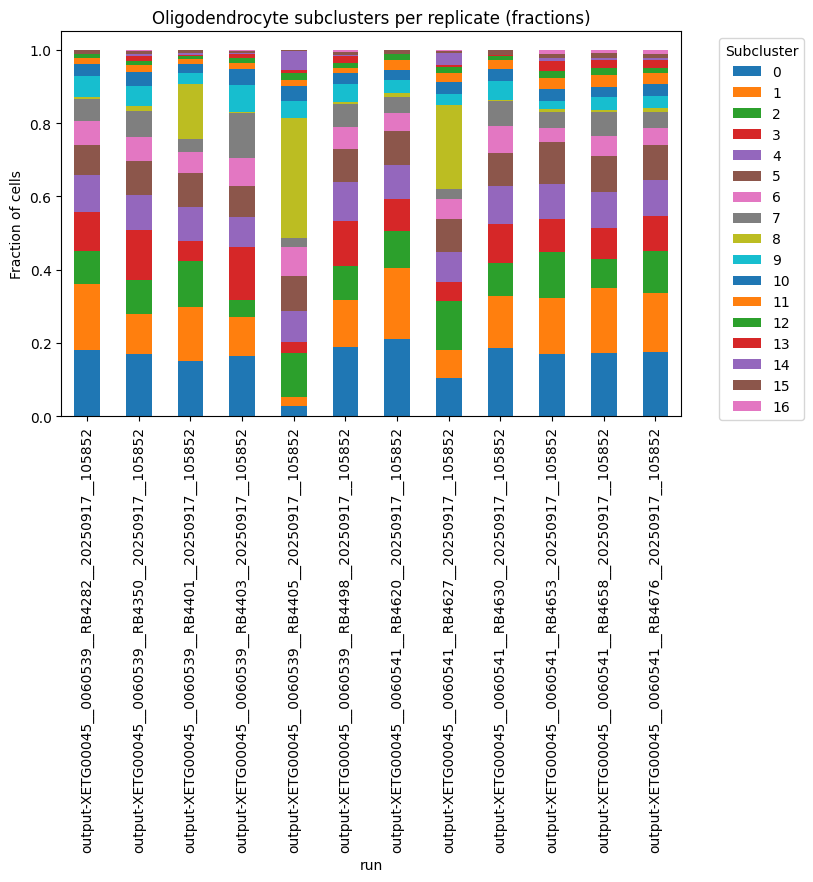

In [59]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# pick your cluster key (change if needed)
cluster_key = "OL_leiden_1"  

# count cells per replicate × cluster
ct = pd.crosstab(adata_OL.obs[cluster_key], adata_OL.obs["run"])

# plot counts
plt.figure(figsize=(8,5))
ct.T.plot(kind="bar", stacked=True, figsize=(8,5))
plt.ylabel("Number of cells")
plt.title("Oligodendrocyte subclusters per replicate")
plt.legend(title="Subcluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# plot fractions
fractions = ct.div(ct.sum(axis=0), axis=1)

plt.figure(figsize=(8,5))
fractions.T.plot(kind="bar", stacked=True, figsize=(8,5))
plt.ylabel("Fraction of cells")
plt.title("Oligodendrocyte subclusters per replicate (fractions)")
plt.legend(title="Subcluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

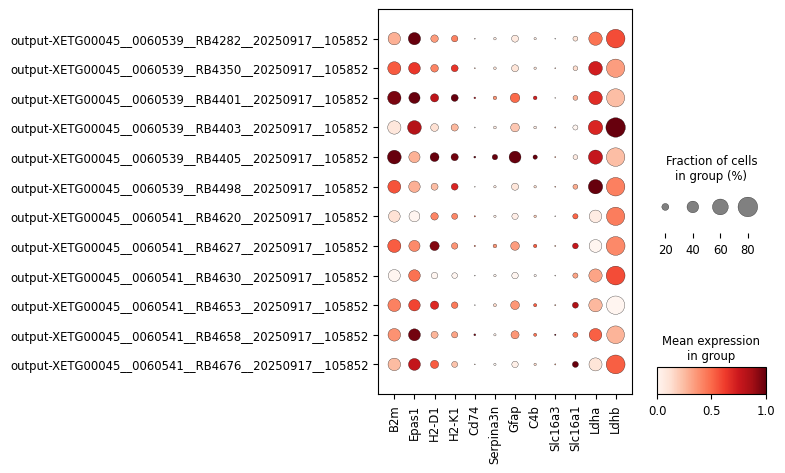

In [61]:
 sc.pl.dotplot(
        adata,
        var_names=['B2m', 'Epas1', 'H2-D1', 'H2-K1', 'Cd74','Serpina3n','Gfap','C4b','Slc16a3','Slc16a1','Ldha','Ldhb'],
        groupby="run",
        standard_scale="var",
        #dot_max=0.5,
        #dot_min=0.05,
        color_map="Reds",
        dendrogram=False,
        figsize=(5, 5),
        
    )

output-XETG00045__0060539__RB4282__20250917__105852


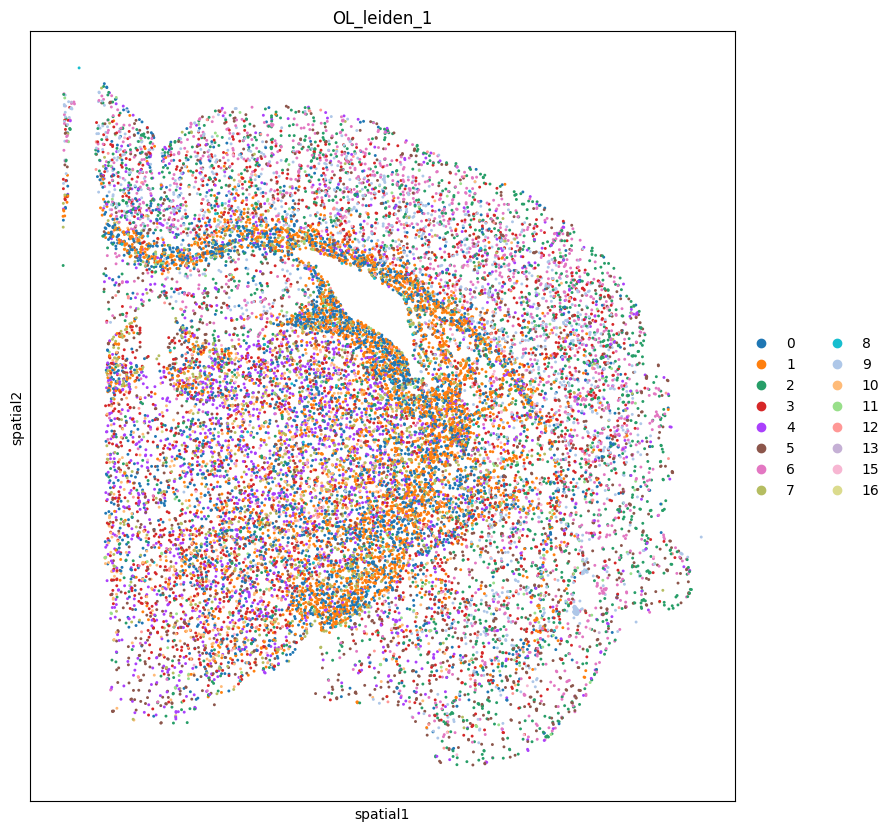

output-XETG00045__0060539__RB4350__20250917__105852


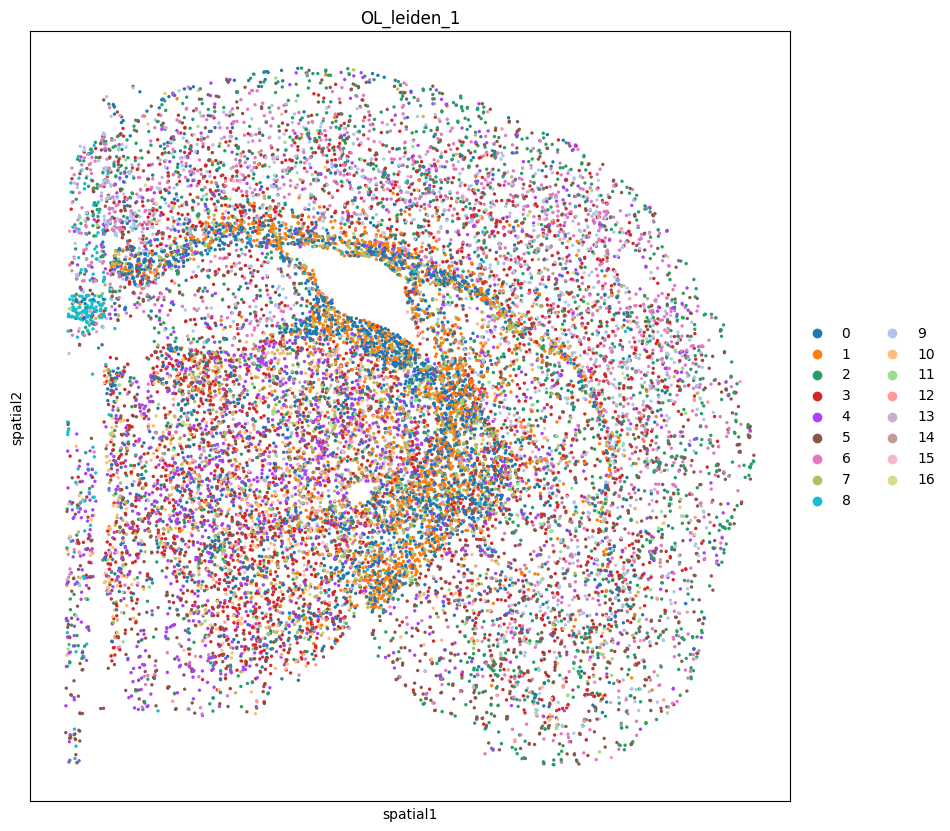

output-XETG00045__0060539__RB4401__20250917__105852


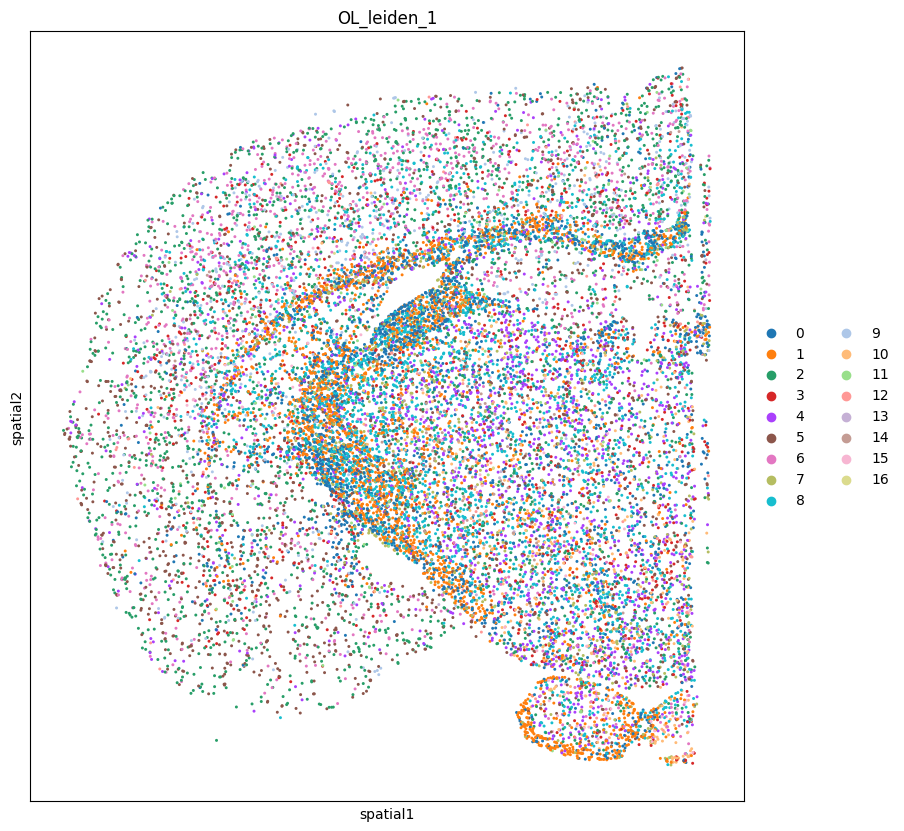

output-XETG00045__0060539__RB4403__20250917__105852


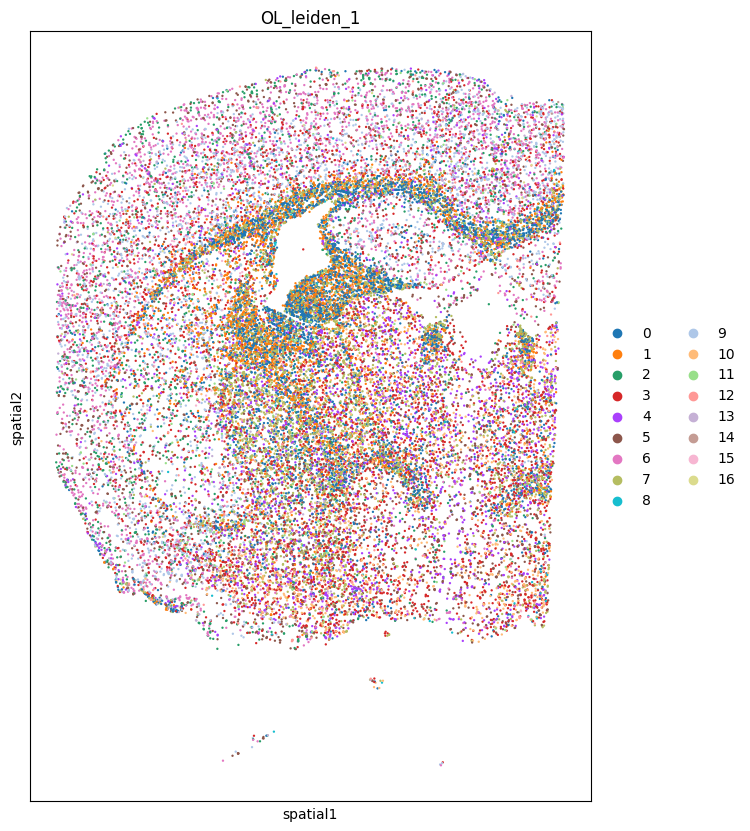

output-XETG00045__0060539__RB4405__20250917__105852


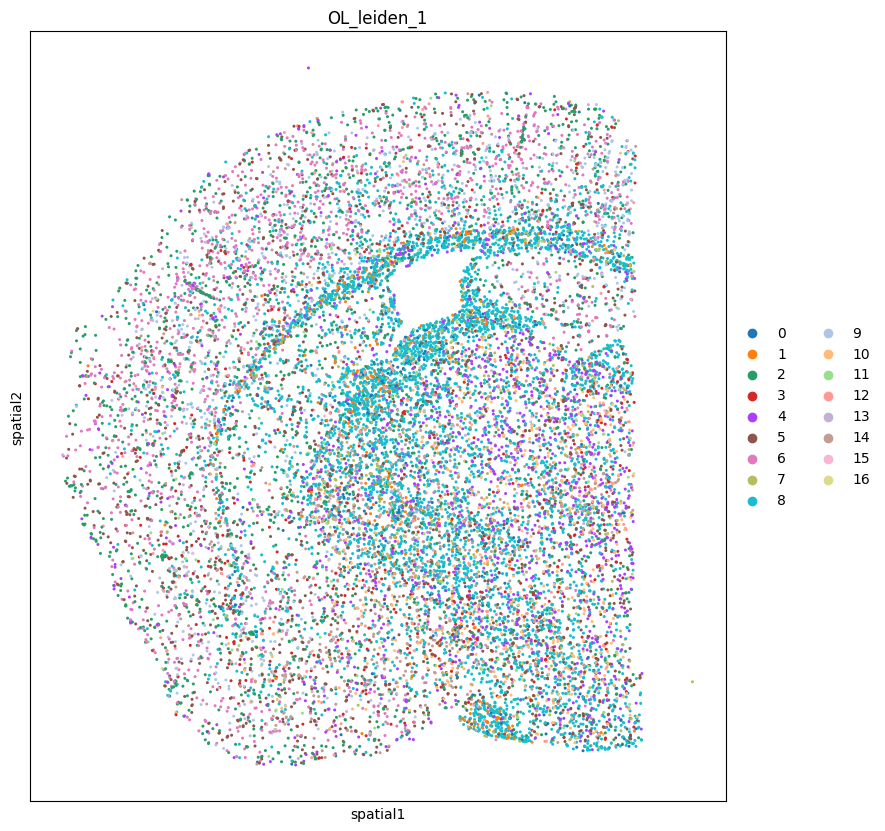

output-XETG00045__0060539__RB4498__20250917__105852


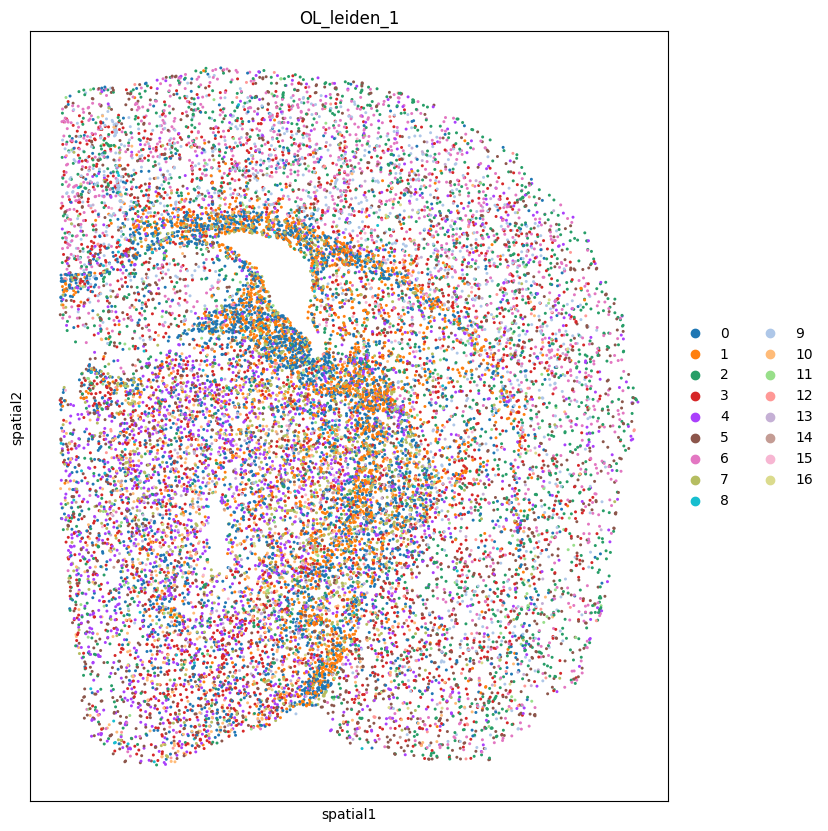

output-XETG00045__0060541__RB4620__20250917__105852


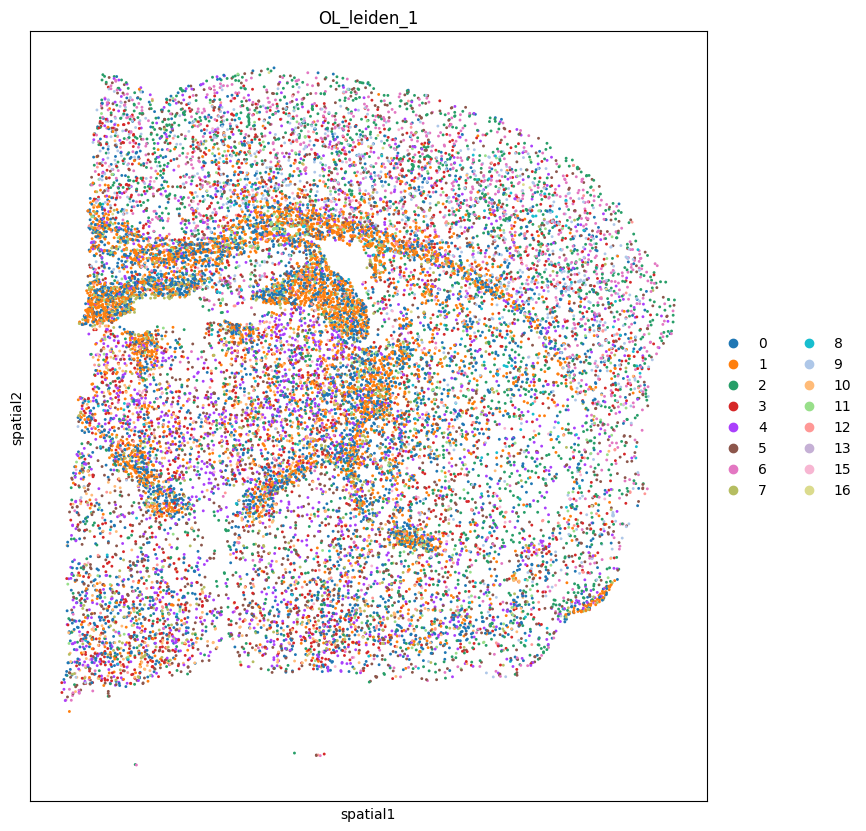

output-XETG00045__0060541__RB4627__20250917__105852


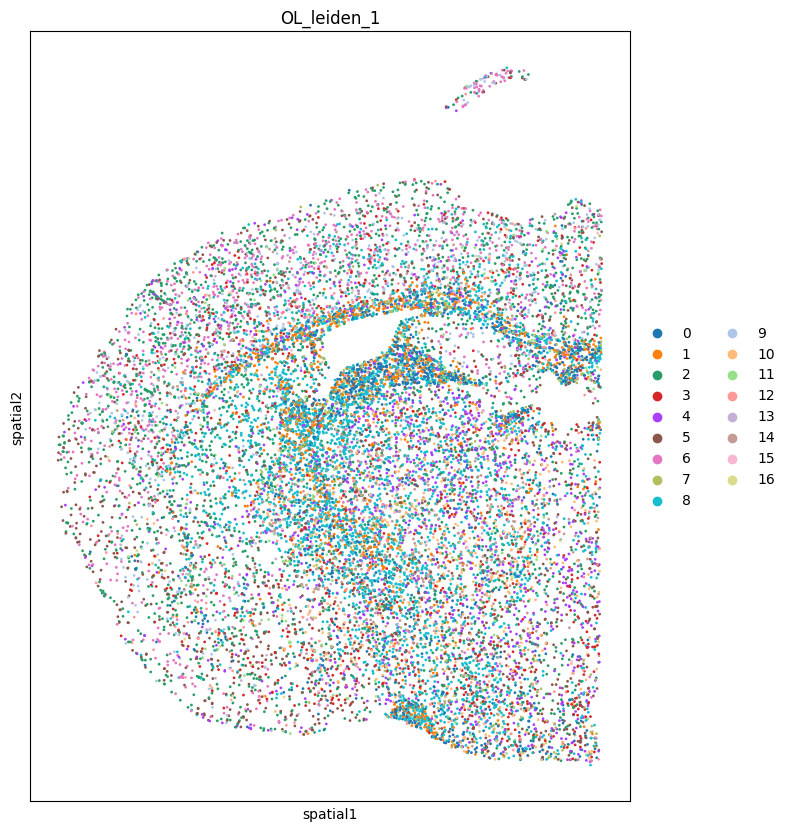

output-XETG00045__0060541__RB4630__20250917__105852


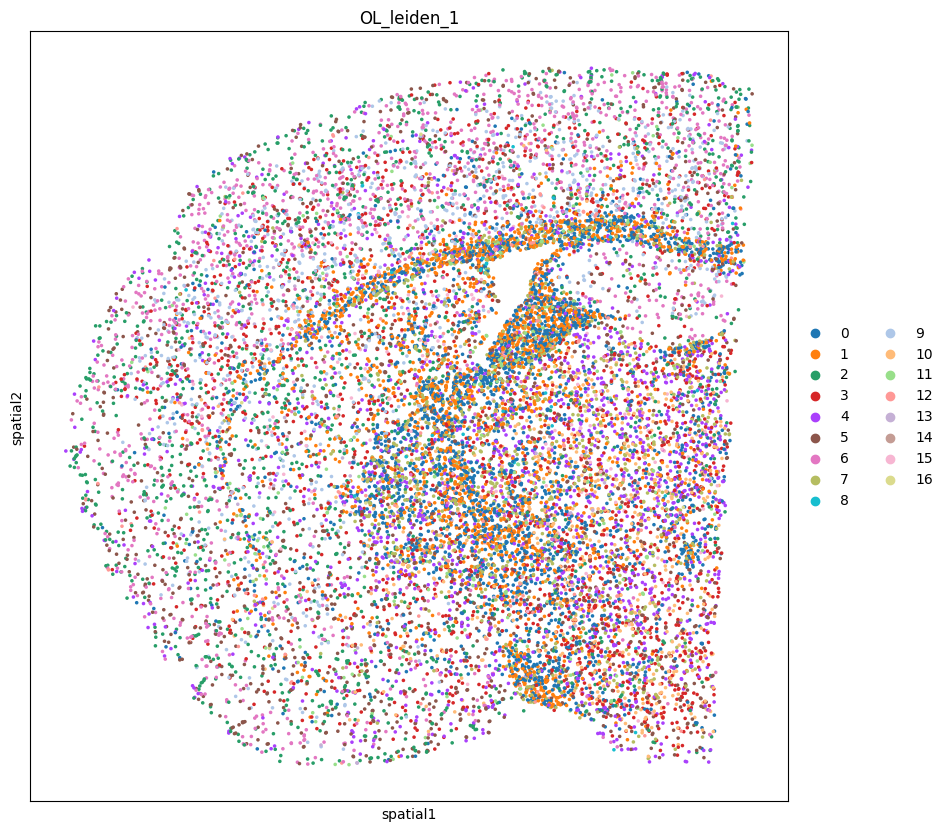

output-XETG00045__0060541__RB4653__20250917__105852


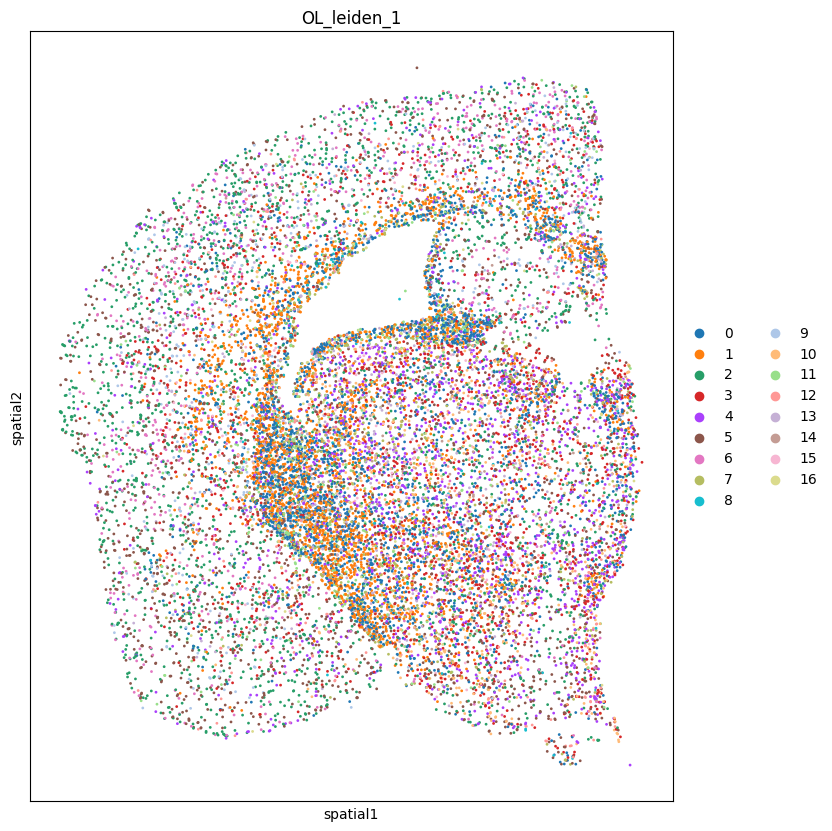

output-XETG00045__0060541__RB4658__20250917__105852


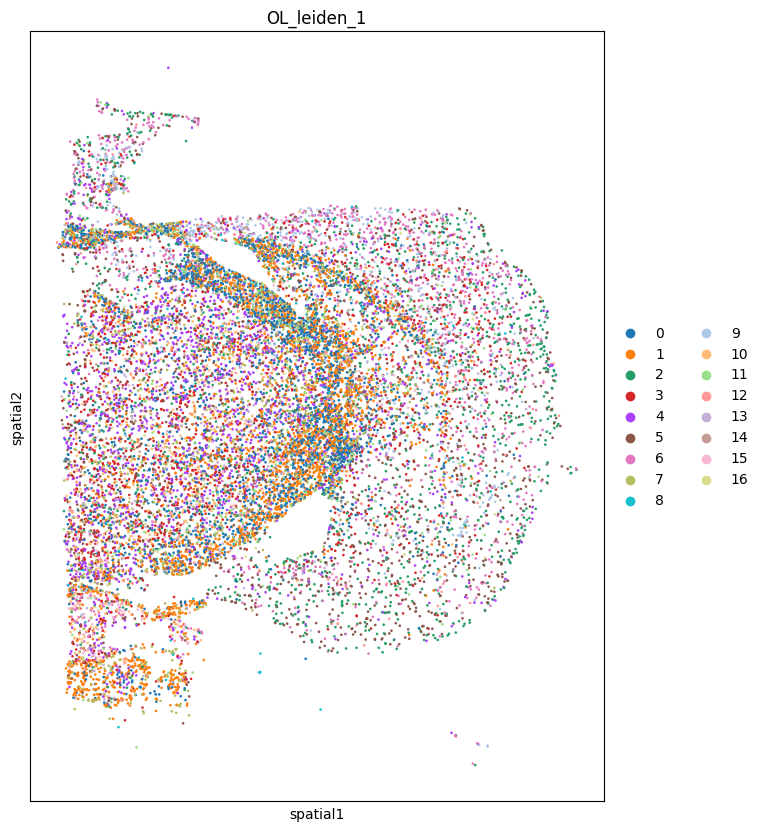

output-XETG00045__0060541__RB4676__20250917__105852


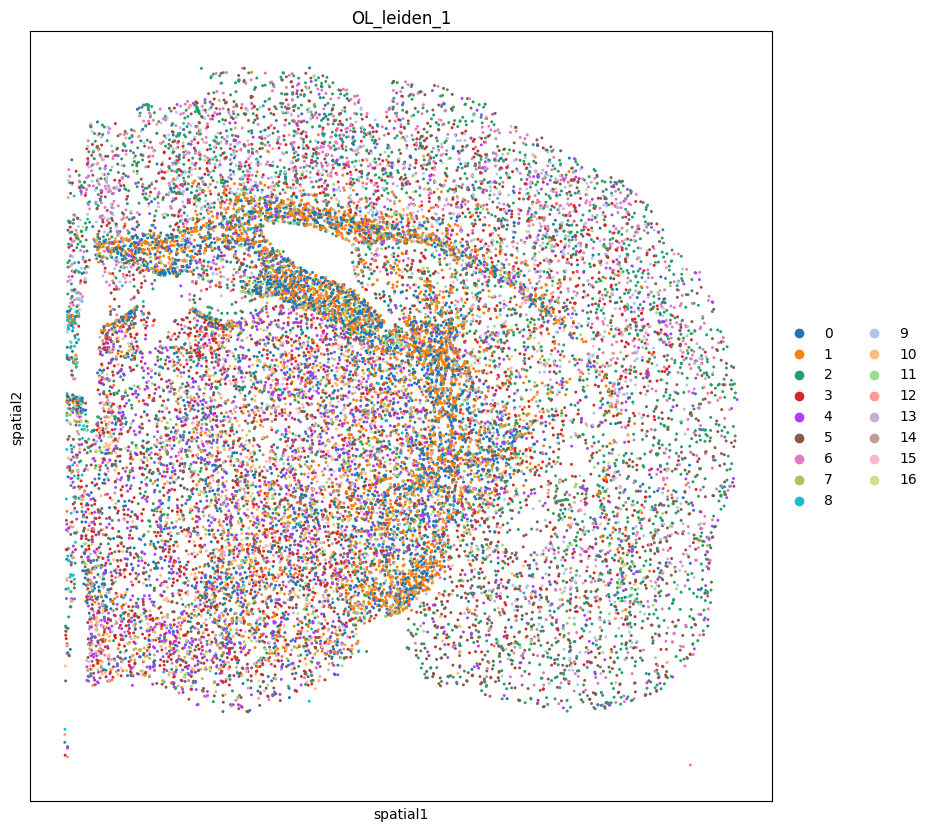

In [64]:
for run in adata_OL.obs['run'].unique():
    print(run)
    ad_int = adata_OL[adata_OL.obs['run'] == run]
    with plt.rc_context({'figure.figsize': (20, 10)}):
        sc.pl.spatial(ad_int, spot_size=25, color = 'OL_leiden_1')
    plt.show()
    

In [67]:
to_remove = [
    "Acadm", "Acadvl", "Atp5f1a", "Cox4i1",
    "Fis1", "Idh3a", "Mdh2", "Prdx3",
    "Suclg1", "Uqcrc1"
]

mito_genes_mouse = [g for g in mito_genes_mouse if g not in to_remove]

print(mito_genes_mouse)

['Ndufa9', 'Ndufs1', 'Sdha', 'Mfn2', 'Opa1', 'Dnm1l', 'Ppargc1a', 'Tfam', 'Pink1', 'Prkn', 'Bnip3', 'Sod2', 'Hspa9', 'Hspd1', 'Cs', 'Ogdh', 'Fh1', 'Cpt1a', 'Ldha', 'Ldhb', 'Slc16a1', 'Slc16a3']


# mitochondrial expression

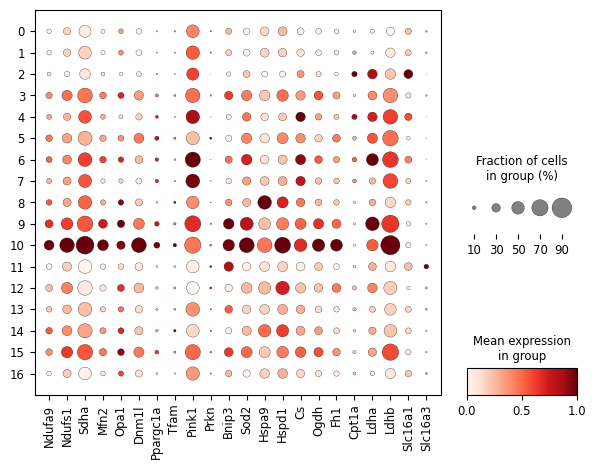

In [70]:
 sc.pl.dotplot(
        adata_OL,
        var_names=mito_genes_mouse,
        groupby="OL_leiden_1",
        standard_scale="var",
        #dot_max=0.5,
        #dot_min=0.05,
        color_map="Reds",
        dendrogram=False,
        figsize=(7, 5),
        
    )

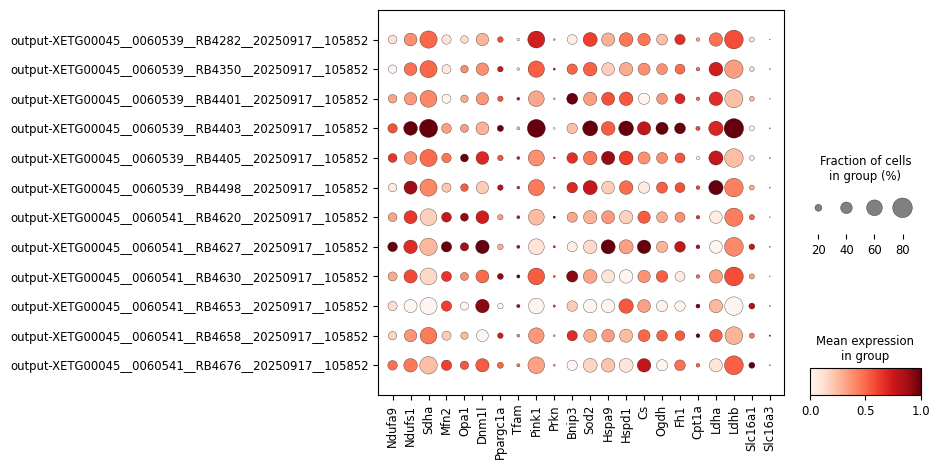

In [71]:
 sc.pl.dotplot(
        adata,
        var_names=mito_genes_mouse,
        groupby="run",
        standard_scale="var",
        #dot_max=0.5,
        #dot_min=0.05,
        color_map="Reds",
        dendrogram=False,
        figsize=(7, 5),
        
    )